In [60]:
import os
import random
import gc

from typing import Optional
from glob import glob
from os.path import join as pjoin
from tqdm.notebook import tqdm

import pandas as pd
import numpy as np
import cv2
import seaborn as sns
import face_recognition

from matplotlib import pyplot as plt

%matplotlib inline

sns.set_style()
tqdm.pandas()

/home/vsydorskyi/anaconda3/envs/venv/lib/python3.7/site-packages/tqdm/std.py:668: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [2]:
def seed_everything(seed=42):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    
seed_everything(seed=42)

## Prepare data

We will use [Celebrity-Face-Recognition-Dataset](https://github.com/prateekmehta59/Celebrity-Face-Recognition-Dataset)

For our case, we will take only part of `part1.zip`, which contains 793 images of Angelina Jolie and at all 43111 images

We will take:
- Angelina Jolie
- Adam Sandler
- Alan Arkin
- Angela Bassett
- Alex Pettyfer
- Al Pacino
- Andy Samberg
- Alan Rickman
- Anna Friel
- Anna Paquin
- Andrew Luck
- Bunch of photos of other celebrities
- Bunch of Cifar-10 photos

In [ ]:
all_pathes = []
all_targets = []

### Prepare Celebrity-Face-Recognition-Dataset images

In [ ]:
CFRD_ROOT = '/ssd_data/celebrity_data/dir_001'
RANDOM_CELEBS = 2_000

#### Choose selected celebreties

In [ ]:
cfrd_folders = [
'Angelina Jolie',
'Adam Sandler',
'Alan Arkin',
'Angela Bassett',
'Alex Pettyfer',
'Al Pacino',
'Andy Samberg',
'Alan Rickman',
'Anna Friel',
'Anna Paquin',
'Andrew Luck'
]
for folder in cfrd_folders: 
    temp_files = glob(pjoin(CFRD_ROOT, folder, "*.jpg"))
    all_pathes += temp_files
    all_targets += [folder]*len(temp_files)
    print(f"{folder} has {len(temp_files)} files")

#### Choose random celebreties

In [ ]:
all_cfrd_files = glob(pjoin(CFRD_ROOT,"**", '*.jpg'))
not_choosen_cfrd_files = list(set(all_cfrd_files) - set(all_pathes))
all_pathes += list(np.random.choice(not_choosen_cfrd_files, RANDOM_CELEBS))
all_targets += ['rand_celeb']*RANDOM_CELEBS

### Add Cifar-10 samples

In [ ]:
CIFAR_ROOT = '/ssd_data/cifar10/train/'
CIFAR_SAMPLES = 2_000

In [ ]:
cifar_samples = glob(pjoin(CIFAR_ROOT, "*.png"))
cifar_samples = list(np.random.choice(cifar_samples, CIFAR_SAMPLES))
all_pathes += cifar_samples
all_targets += ['no_face'] * CIFAR_SAMPLES

### Save our dataset

In [ ]:
df = pd.DataFrame(
    columns=['oroginal_path', 'label'],
    data=zip(all_pathes, all_targets)
)
df['basename'] = df['oroginal_path'].apply(os.path.basename)

In [ ]:
df = df[df['oroginal_path'].apply(lambda x: cv2.imread(x) is not None)]
df = df.reset_index(drop=True)

In [ ]:
plt.figure(figsize=(30,10))
sns.countplot(df['label'])
plt.show()

In [ ]:
df.to_csv('data/df.csv', index=False)

df

### Load dataset

In [3]:
df = pd.read_csv('data/df.csv')

## Visualise samples

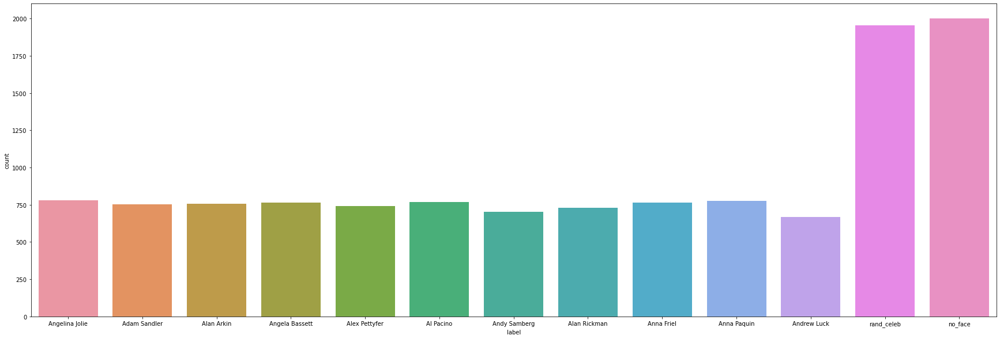

In [4]:
plt.figure(figsize=(30,10))
sns.countplot(df['label'])
plt.show()

In [5]:
def show_image(filename: Optional[str] = None, im: Optional[np.ndarray] = None):
    if filename is None and im is None:
        raise RuntimeError("Specify `filename` or `im`")
        
    if im is None:
        im = cv2.imread(filename)
        
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    
    if filename is not None:
        plt.title(os.path.basename(filename))
    plt.imshow(im)
    plt.show()

======= Label Angelina Jolie =======


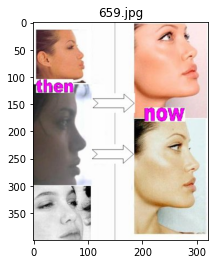

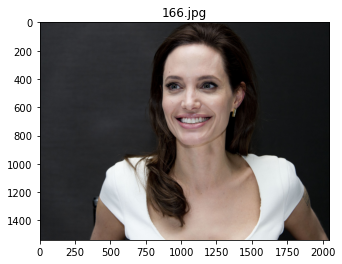

======= Label Adam Sandler =======


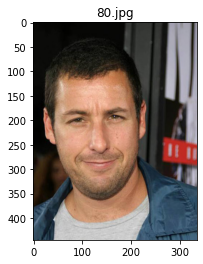

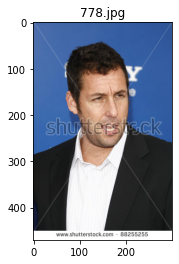

======= Label Alan Arkin =======


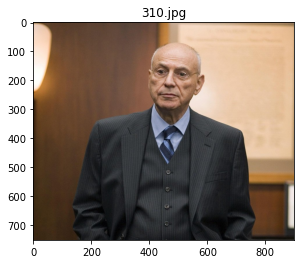

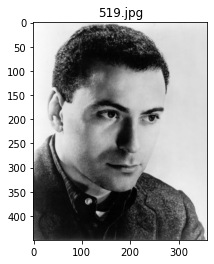

======= Label Angela Bassett =======


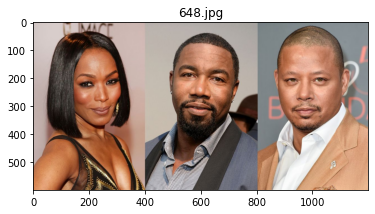

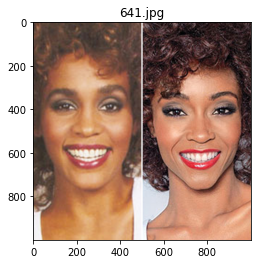

======= Label Alex Pettyfer =======


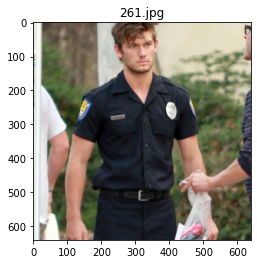

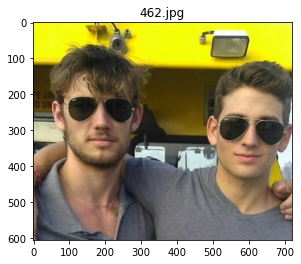

======= Label Al Pacino =======


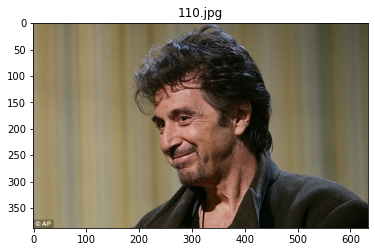

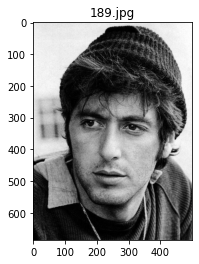

======= Label Andy Samberg =======


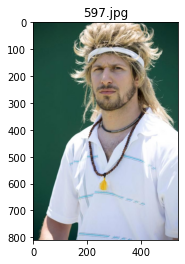

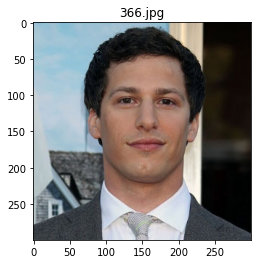

======= Label Alan Rickman =======


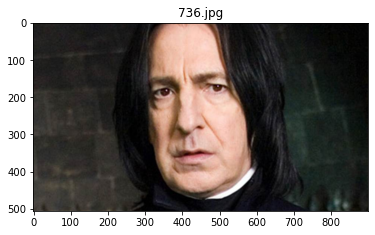

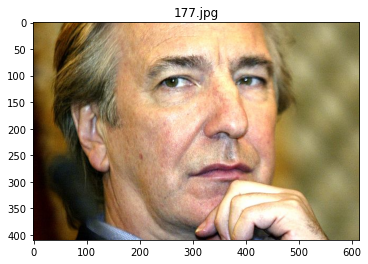

======= Label Anna Friel =======


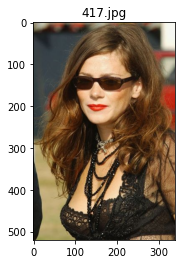

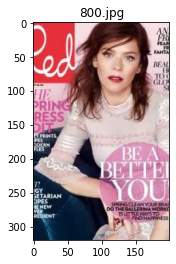

======= Label Anna Paquin =======


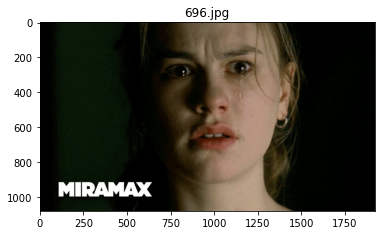

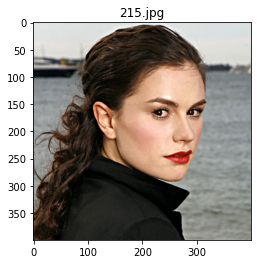

======= Label Andrew Luck =======


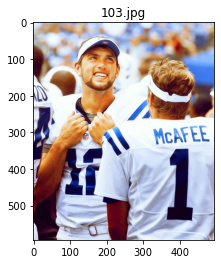

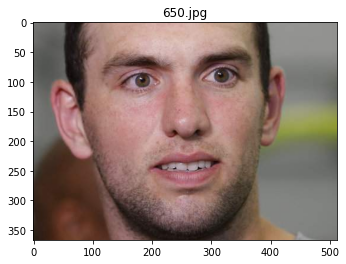

======= Label rand_celeb =======


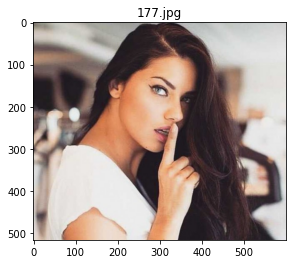

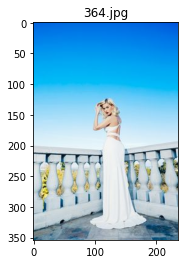

======= Label no_face =======


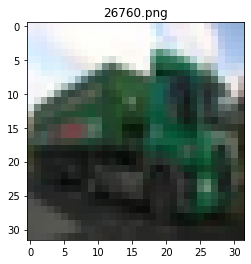

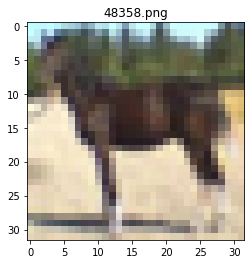

In [7]:
for l in df.label.unique():
    two_samples = np.random.choice(df.loc[df.label == l, 'oroginal_path'].tolist(), 2)
    print(f"======= Label {l} =======")
    show_image(two_samples[0])
    show_image(two_samples[1])

## Apply Face Detection Algorithmes

In this notebook we will observe 3 algorithmes and save processed datasets

In [62]:
IM_SIZE = 128

def preprocess_data(
    filename: str,
    detection_alg: object,
    load_image: bool,
    save_folder: str,
    resize_size: int = IM_SIZE
):
    # Cifar-10 contains only no face photos
    # We will only resize it
    if filename.endswith('.png'): 
        temp_im = cv2.imread(filename)
        temp_im = cv2.resize(temp_im, (resize_size, resize_size))
        
        folder_path = pjoin(save_folder,'cifar')
        os.makedirs(folder_path, exist_ok=True)
        
        save_path = pjoin(folder_path, os.path.basename(filename))
        cv2.imwrite(save_path, temp_im)
        return save_path
    
    if load_image:
        temp_im = cv2.imread(filename)
        face_im = detection_alg(temp_im)
    else:
        face_im = detection_alg(filename)
        
    gc.collect()
    
    if face_im is not None:
        face_im = cv2.resize(face_im, (resize_size, resize_size))
        
        folder_path = pjoin(save_folder,filename.split('/')[-2])    
        os.makedirs(folder_path, exist_ok=True)
        save_path = pjoin(folder_path, os.path.basename(filename))
        
        cv2.imwrite(save_path, face_im)
    else:
        save_path = None
        
    gc.collect()
        
    return save_path

In [8]:
# Choose some Joli samples
rand_joli_pathes = df.loc[df.label == 'Angelina Jolie', 'oroginal_path'].tolist()
bad_joli_samples = [rand_joli_pathes[0], rand_joli_pathes[15]]
rand_joli_pathes = list(np.random.choice(rand_joli_pathes, 5)) + bad_joli_samples

# Choose some other samples
other_rand_samples = [
    (l, np.random.choice(df.loc[df.label == l, 'oroginal_path'].tolist()))
    for l in df.label.unique()
]

In [71]:
detection_result_df = pd.DataFrame(columns=[
    'alg_name', 'percantage_of_founded_face', 'time', 'quality'
])

### Violla Johns

Use [cv2 algorithm](https://docs.opencv.org/3.4/db/d28/tutorial_cascade_classifier.html)

In [9]:
CV2_PRETRAINED_PATH = '/home/vsydorskyi/src/opencv/data/haarcascades/haarcascade_frontalface_alt.xml'
VIOLLA_DATAEST = '/ssd_data/celebrity_data/violla'

In [10]:
class ViollaJohns(object):
    
    def __init__(
        self,
        pretrained_model_path: str,
        verbose: bool = False,
        scale_factor: float = 1.1,
        min_neighbors: int = 3,
        padding: int = 20,
    ):
        self.face_cascade = cv2.CascadeClassifier()
        self.face_cascade.load(cv2.samples.findFile(
            pretrained_model_path
        ))
        
        self.scale_factor = scale_factor
        self.min_neighbors = min_neighbors
        self.padding = padding
        self.verbose = verbose
        
    @staticmethod
    def preprocess(im: np.ndarray):
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
        im = cv2.equalizeHist(im)
        return im
    
    @staticmethod
    def select_max_area_segment(coords: np.ndarray):
        areas = [el[-1]*el[-2] for el in coords]
        max_array_segment = coords[np.argmax(areas)]
        return max_array_segment
    
    def apply_coords(self, im: np.ndarray, coord: np.ndarray):
        x,y,w,h = coord
        top, left, bottom, right = y, x, y+h, x+w
        max_height, max_width = im.shape[0], im.shape[1]

        top = top - self.padding
        top = top if top > 0 else 0

        bottom = bottom + self.padding
        bottom = bottom if bottom < max_height else max_height

        left = left - self.padding
        left = left if  left > 0 else 0

        right = right + self.padding
        right = right if right < max_width else max_width

        bounded = im[top:bottom,left:right,:]
        return bounded
    
    def predict(self, im: np.ndarray):
        im = ViollaJohns.preprocess(im)
        coords = self.face_cascade.detectMultiScale(
            im, 
            scaleFactor=self.scale_factor,
            minNeighbors=self.min_neighbors
        )
        return coords
    
    def transform(self, im: np.ndarray):
        coords = self.predict(im)
        # Return None if no face was found
        if len(coords) == 0:
            if self.verbose: print("No Face was found")
            return None
        # Take first if we found only one face
        elif len(coords) == 1:
            if self.verbose: print(f"One Face was found")
            return self.apply_coords(im, coords[0])
        # Take the max area face if we have several
        elif len(coords) > 0:
            if self.verbose: print(f"{len(coords)} Faces were found")
            best_mask = ViollaJohns.select_max_area_segment(coords)
            return self.apply_coords(im, best_mask)


In [11]:
alg = ViollaJohns(
    CV2_PRETRAINED_PATH, 
    verbose=True,
    scale_factor=1.1, 
    min_neighbors=3
)

#### Apply ViollaJohns on Angelina Jolie

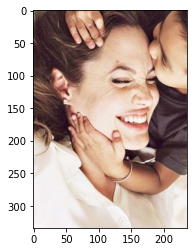

No Face was found
+++++++++++++++++


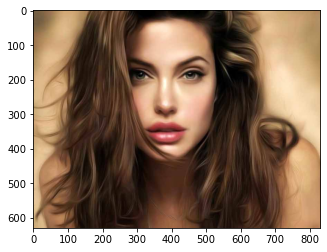

One Face was found


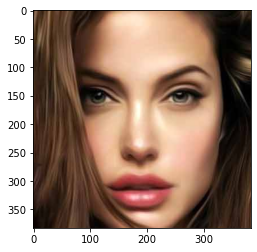

+++++++++++++++++


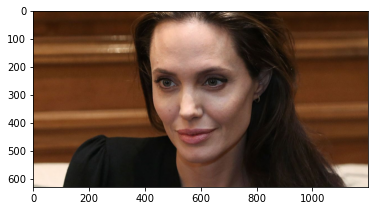

One Face was found


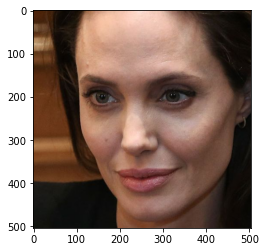

+++++++++++++++++


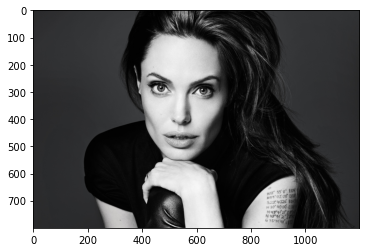

One Face was found


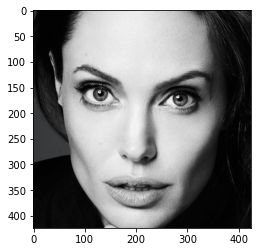

+++++++++++++++++


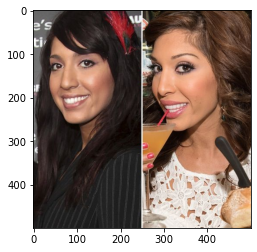

2 Faces were found


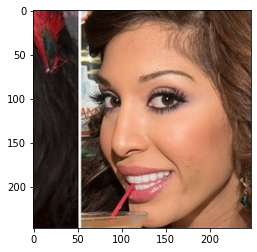

+++++++++++++++++


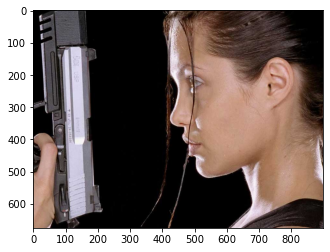

2 Faces were found


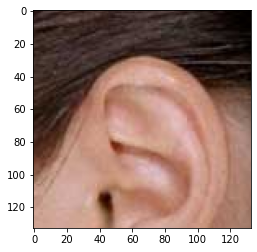

+++++++++++++++++


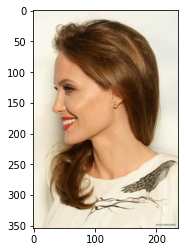

No Face was found
+++++++++++++++++


In [12]:
for im_name in rand_joli_pathes:
    print("=================")
    temp_im = cv2.imread(im_name)
    show_image(im=temp_im)
    face_im = alg.transform(temp_im)
    if face_im is not None:
        show_image(im=face_im)
    print("+++++++++++++++++")

#### Apply ViollaJohns on other labels

======== Angelina Jolie =========


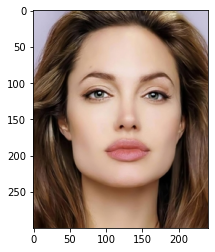

One Face was found


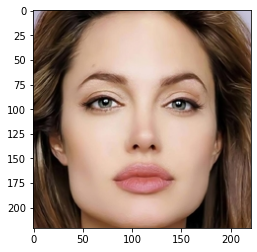

+++++++++++++++++
======== Adam Sandler =========


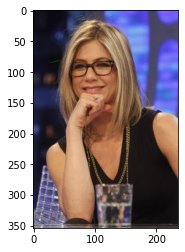

3 Faces were found


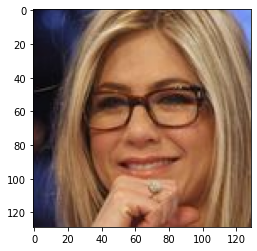

+++++++++++++++++
======== Alan Arkin =========


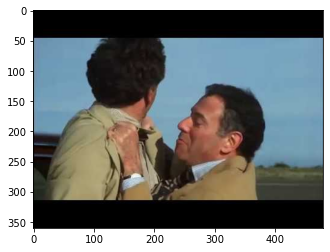

No Face was found
+++++++++++++++++
======== Angela Bassett =========


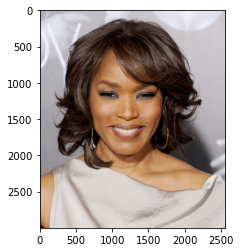

One Face was found


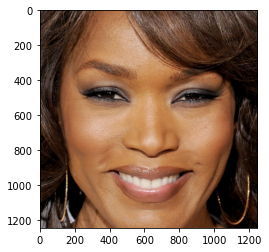

+++++++++++++++++
======== Alex Pettyfer =========


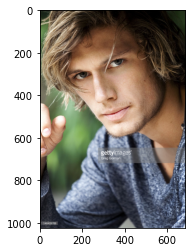

No Face was found
+++++++++++++++++
======== Al Pacino =========


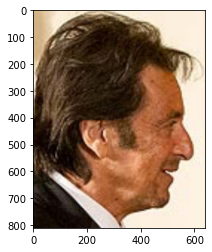

No Face was found
+++++++++++++++++
======== Andy Samberg =========


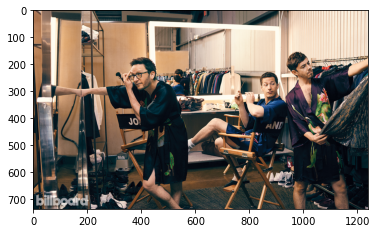

One Face was found


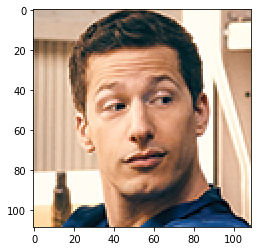

+++++++++++++++++
======== Alan Rickman =========


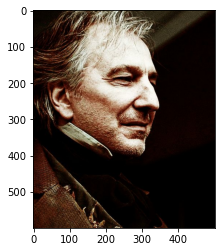

One Face was found


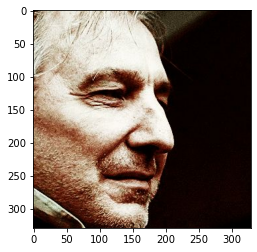

+++++++++++++++++
======== Anna Friel =========


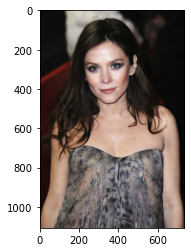

One Face was found


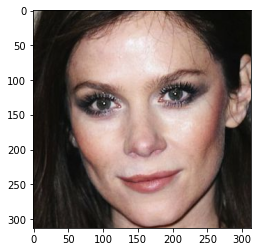

+++++++++++++++++
======== Anna Paquin =========


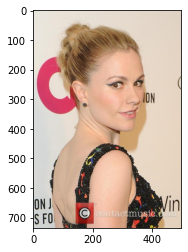

No Face was found
+++++++++++++++++
======== Andrew Luck =========


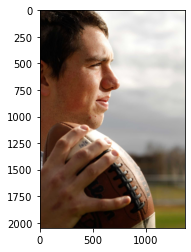

One Face was found


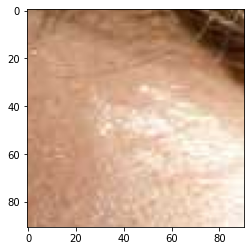

+++++++++++++++++
======== rand_celeb =========


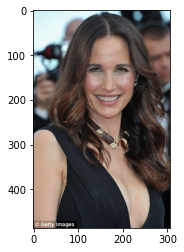

One Face was found


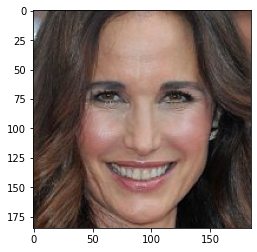

+++++++++++++++++
======== no_face =========


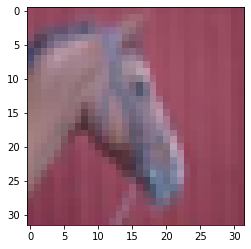

No Face was found
+++++++++++++++++


In [13]:
for l, im_name in other_rand_samples:
    print(f"======== {l} =========")
    temp_im = cv2.imread(im_name)
    show_image(im=temp_im)
    face_im = alg.transform(temp_im)
    if face_im is not None:
        show_image(im=face_im)
    print("+++++++++++++++++")

#### Save dataset

In [ ]:
alg = ViollaJohns(
    CV2_PRETRAINED_PATH, 
    verbose=False,
    scale_factor=1.1, 
    min_neighbors=3
)

df['violla_default_pathes'] = df['oroginal_path'].progress_apply(lambda x: preprocess_data(
    filename=x, 
    detection_alg=alg.transform, 
    load_image=True, 
    save_folder=pjoin(VIOLLA_DATAEST, 'default')
))

In [25]:
print(" Percantage of no face found (True)")
df.loc[df['label'] != 'no_face', 'violla_default_pathes'].isna().value_counts(normalize=True)

 Percantage of no face found (True)


False    0.793898
True     0.206102
Name: violla_default_pathes, dtype: float64

In [77]:
detection_result_df = detection_result_df.append({
    'alg_name': 'violla_default',
    'percantage_of_founded_face': (~df.loc[df['label'] != 'no_face', 'violla_default_pathes'].isna()).sum() / (df['label'] != 'no_face').sum(),
    'time': '11min 41sec',
    'quality': 'some mistakes'
}, ignore_index=True)

detection_result_df

,alg_name,percantage_of_founded_face,time,quality
0,violla_default,0.793898,11min 41sec,some mistakes


In [29]:
alg = ViollaJohns(
    CV2_PRETRAINED_PATH, 
    verbose=False,
    scale_factor=3.0, 
    min_neighbors=5
)

df['violla_mn5_sf3_pathes'] = df['oroginal_path'].progress_apply(lambda x: preprocess_data(
    filename=x, 
    detection_alg=alg.transform, 
    load_image=True, 
    save_folder=pjoin(VIOLLA_DATAEST, 'mn5_sf3')
))

In [30]:
print(" Percantage of no face found (True)")
df.loc[df['label'] != 'no_face', 'violla_mn5_sf3_pathes'].isna().value_counts(normalize=True)

 Percantage of no face found (True)


True     0.810039
False    0.189961
Name: violla_mn5_sf3_pathes, dtype: float64

In [78]:
detection_result_df = detection_result_df.append({
    'alg_name': 'violla_mn5_sf3',
    'percantage_of_founded_face': (~df.loc[df['label'] != 'no_face', 'violla_mn5_sf3_pathes'].isna()).sum() / (df['label'] != 'no_face').sum(),
    'time': '18min 17sec',
    'quality': 'very bad'
}, ignore_index=True)

detection_result_df

,alg_name,percantage_of_founded_face,time,quality
0,violla_default,0.793898,11min 41sec,some mistakes
1,violla_mn5_sf3,0.189961,18min 17sec,very bad


In [31]:
alg = ViollaJohns(
    CV2_PRETRAINED_PATH, 
    verbose=False,
    scale_factor=1.1, 
    min_neighbors=1
)

df['violla_mn1_sfdef_pathes'] = df['oroginal_path'].progress_apply(lambda x: preprocess_data(
    filename=x, 
    detection_alg=alg.transform, 
    load_image=True, 
    save_folder=pjoin(VIOLLA_DATAEST, 'mn1_sfdef')
))

In [33]:
print(" Percantage of no face found (True)")
df.loc[df['label'] != 'no_face', 'violla_mn1_sfdef_pathes'].isna().value_counts(normalize=True)

 Percantage of no face found (True)


False    0.896949
True     0.103051
Name: violla_mn1_sfdef_pathes, dtype: float64

In [79]:
detection_result_df = detection_result_df.append({
    'alg_name': 'violla_mn1_sfdef',
    'percantage_of_founded_face': (~df.loc[df['label'] != 'no_face', 'violla_mn1_sfdef_pathes'].isna()).sum() / (df['label'] != 'no_face').sum(),
    'time': '11min 54sec',
    'quality': 'some mistakes'
}, ignore_index=True)

detection_result_df

,alg_name,percantage_of_founded_face,time,quality
0,violla_default,0.793898,11min 41sec,some mistakes
1,violla_mn5_sf3,0.189961,18min 17sec,very bad
2,violla_mn1_sfdef,0.896949,11min 54sec,some mistakes


In [80]:
alg = ViollaJohns(
    CV2_PRETRAINED_PATH, 
    verbose=False,
    scale_factor=1.05, 
    min_neighbors=5
)

df['violla_mn5_sf105_pathes'] = df['oroginal_path'].progress_apply(lambda x: preprocess_data(
    filename=x, 
    detection_alg=alg.transform, 
    load_image=True, 
    save_folder=pjoin(VIOLLA_DATAEST, 'mn5_sf105')
))

In [81]:
print(" Percantage of no face found (True)")
df.loc[df['label'] != 'no_face', 'violla_mn5_sf105_pathes'].isna().value_counts(normalize=True)

 Percantage of no face found (True)


False    0.821949
True     0.178051
Name: violla_mn5_sf105_pathes, dtype: float64

In [82]:
detection_result_df = detection_result_df.append({
    'alg_name': 'violla_mn5_sf105',
    'percantage_of_founded_face': (~df.loc[df['label'] != 'no_face', 'violla_mn5_sf105_pathes'].isna()).sum() / (df['label'] != 'no_face').sum(),
    'time': '49min 41sec',
    'quality': 'some mistakes'
}, ignore_index=True)

detection_result_df

,alg_name,percantage_of_founded_face,time,quality
0,violla_default,0.793898,11min 41sec,some mistakes
1,violla_mn5_sf3,0.189961,18min 17sec,very bad
2,violla_mn1_sfdef,0.896949,11min 54sec,some mistakes
3,violla_mn5_sf105,0.821949,49min 41sec,some mistakes


### HOG algorithm

Use [face-recognition](https://pypi.org/project/face-recognition/)

In [37]:
HOG_DATAEST = '/ssd_data/celebrity_data/hog'

In [34]:
def face_detection_max_area(coords: np.ndarray):
    areas = [(el[2] - el[0])*(el[3] - el[1]) for el in coords]
    max_array_segment = coords[np.argmax(areas)]
    return max_array_segment

def face_detection_hog(image_path: str, padding: int = 20, verbose: bool = False):
    input_image = face_recognition.load_image_file(image_path)
    face_locations = face_recognition.face_locations(input_image, model='hog')
    
    if len(face_locations) == 0:
        if verbose: print("No Face was found")
        return None
    # Take first if we found only one face
    elif len(face_locations) == 1:
        if verbose: print(f"One Face was found")
        face_locations = face_locations[0]
    # Take the max area face if we have several
    elif len(face_locations) > 0:
        if verbose: print(f"{len(face_locations)} Faces were found")
        face_locations = face_detection_max_area(face_locations)
    
    top, right, bottom, left = face_locations
    max_height, max_width = input_image.shape[0], input_image.shape[1]
    
    top = top - padding
    top = top if top > 0 else 0
    
    bottom = bottom + padding
    bottom = bottom if bottom < max_height else max_height
    
    left = left - padding
    left = left if  left > 0 else 0
    
    right = right + padding
    right = right if right < max_width else max_width
    
    input_image = input_image[top:bottom,left:right,:]
    input_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2BGR)
    
    return input_image


#### Apply HOG on Angelina Jolie

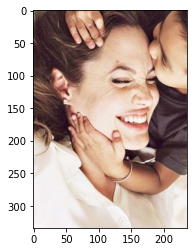

One Face was found


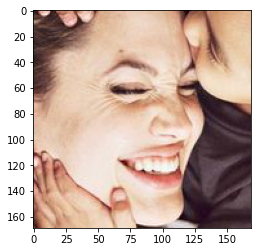

+++++++++++++++++


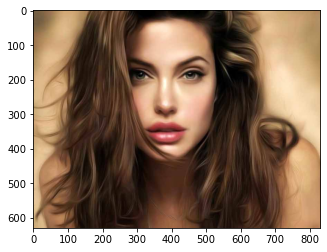

One Face was found


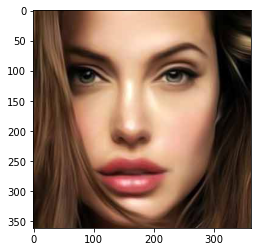

+++++++++++++++++


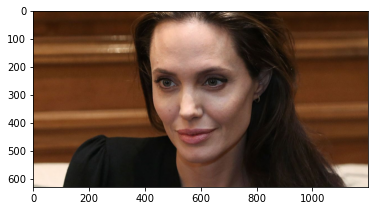

One Face was found


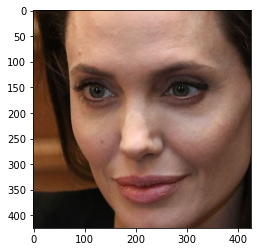

+++++++++++++++++


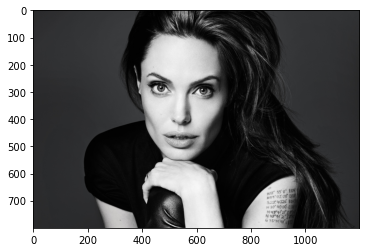

One Face was found


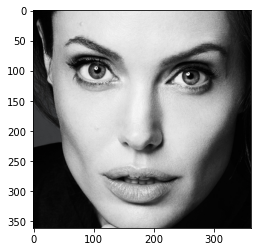

+++++++++++++++++


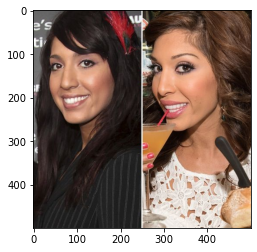

2 Faces were found


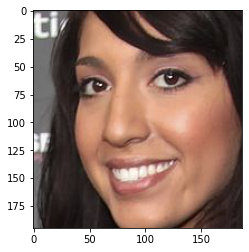

+++++++++++++++++


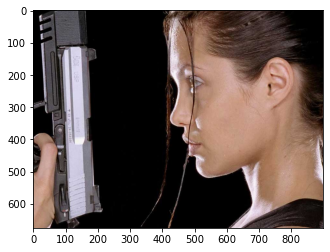

No Face was found
+++++++++++++++++


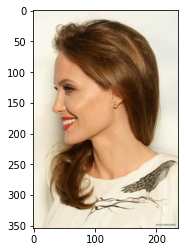

One Face was found


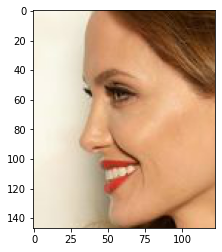

+++++++++++++++++


In [35]:
for im_name in rand_joli_pathes:
    print("=================")
    temp_im = cv2.imread(im_name)
    show_image(im=temp_im)
    face_im = face_detection_hog(im_name, verbose=True)
    if face_im is not None:
        show_image(im=face_im)
    print("+++++++++++++++++")

#### Apply HOG on other labels

======== Angelina Jolie =========


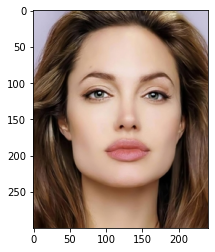

One Face was found


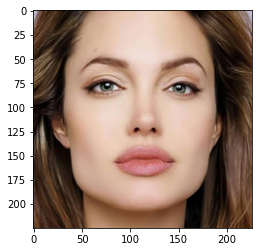

+++++++++++++++++
======== Adam Sandler =========


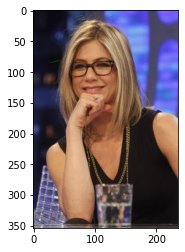

One Face was found


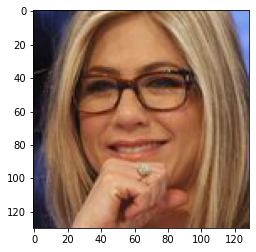

+++++++++++++++++
======== Alan Arkin =========


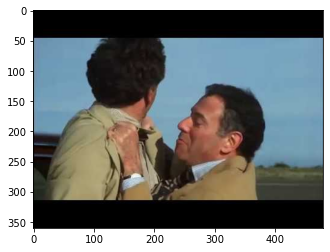

No Face was found
+++++++++++++++++
======== Angela Bassett =========


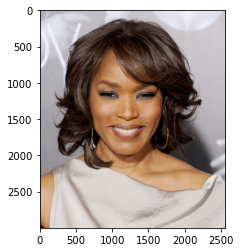

One Face was found


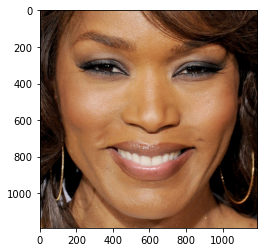

+++++++++++++++++
======== Alex Pettyfer =========


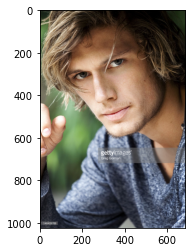

One Face was found


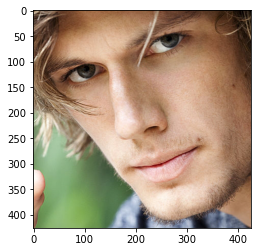

+++++++++++++++++
======== Al Pacino =========


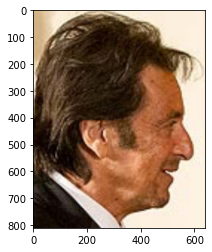

No Face was found
+++++++++++++++++
======== Andy Samberg =========


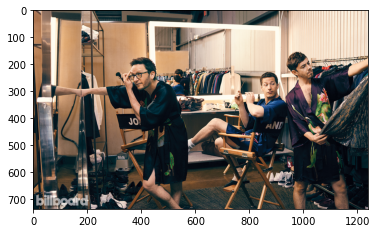

2 Faces were found


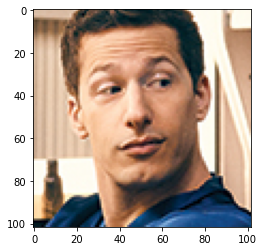

+++++++++++++++++
======== Alan Rickman =========


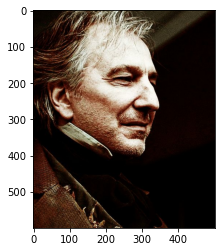

One Face was found


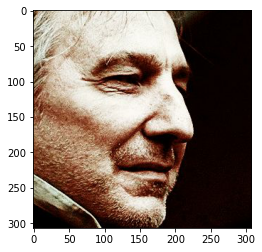

+++++++++++++++++
======== Anna Friel =========


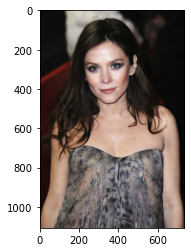

One Face was found


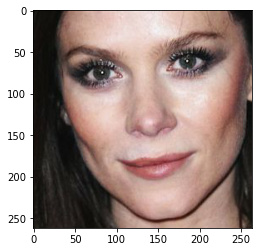

+++++++++++++++++
======== Anna Paquin =========


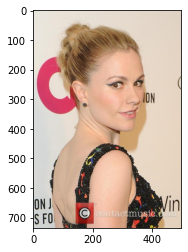

One Face was found


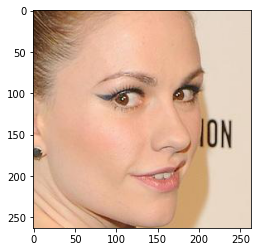

+++++++++++++++++
======== Andrew Luck =========


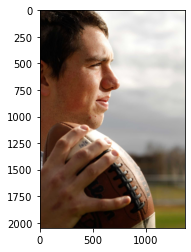

No Face was found
+++++++++++++++++
======== rand_celeb =========


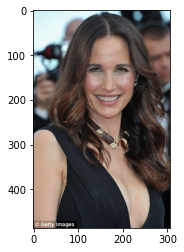

One Face was found


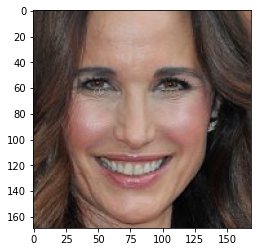

+++++++++++++++++
======== no_face =========


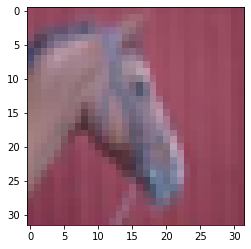

No Face was found
+++++++++++++++++


In [36]:
for l, im_name in other_rand_samples:
    print(f"======== {l} =========")
    temp_im = cv2.imread(im_name)
    show_image(im=temp_im)
    face_im = face_detection_hog(im_name, verbose=True)
    if face_im is not None:
        show_image(im=face_im)
    print("+++++++++++++++++")

#### Save dataset

In [38]:
df['hog_pathes'] = df['oroginal_path'].progress_apply(lambda x: preprocess_data(
    filename=x, 
    detection_alg=face_detection_hog, 
    load_image=False, 
    save_folder=HOG_DATAEST
))

/home/vsydorskyi/anaconda3/envs/venv/lib/python3.7/site-packages/PIL/Image.py:961: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [39]:
print(" Percantage of no face found (True)")
df.loc[df['label'] != 'no_face', 'hog_pathes'].isna().value_counts(normalize=True)

 Percantage of no face found (True)


False    0.905217
True     0.094783
Name: hog_pathes, dtype: float64

In [83]:
detection_result_df = detection_result_df.append({
    'alg_name': 'hog',
    'percantage_of_founded_face': (~df.loc[df['label'] != 'no_face', 'hog_pathes'].isna()).sum() / (df['label'] != 'no_face').sum(),
    'time': '57min 59sec',
    'quality': 'few mistakes'
}, ignore_index=True)

detection_result_df

,alg_name,percantage_of_founded_face,time,quality
0,violla_default,0.793898,11min 41sec,some mistakes
1,violla_mn5_sf3,0.189961,18min 17sec,very bad
2,violla_mn1_sfdef,0.896949,11min 54sec,some mistakes
3,violla_mn5_sf105,0.821949,49min 41sec,some mistakes
4,hog,0.905217,57min 59sec,few mistakes


### CNN based algorithm 

Use [face-recognition](https://pypi.org/project/face-recognition/)

In [55]:
CNN_DATAEST = '/ssd_data/celebrity_data/cnnalg'

In [63]:
def face_detection_cnn(image_path: str, padding: int = 20, verbose: bool = False): 
    try:
        input_image = face_recognition.load_image_file(image_path)
        face_locations = face_recognition.face_locations(input_image, model='cnn')
    except Exception as e:
        print(f"Internal error : {e}")
        face_locations = []
    
    if len(face_locations) == 0:
        if verbose: print("No Face was found")
        return None
    # Take first if we found only one face
    elif len(face_locations) == 1:
        if verbose: print(f"One Face was found")
        face_locations = face_locations[0]
    # Take the max area face if we have several
    elif len(face_locations) > 0:
        if verbose: print(f"{len(face_locations)} Faces were found")
        face_locations = face_detection_max_area(face_locations)
    
    top, right, bottom, left = face_locations
    max_height, max_width = input_image.shape[0], input_image.shape[1]
    
    top = top - padding
    top = top if top > 0 else 0
    
    bottom = bottom + padding
    bottom = bottom if bottom < max_height else max_height
    
    left = left - padding
    left = left if  left > 0 else 0
    
    right = right + padding
    right = right if right < max_width else max_width
    
    input_image = input_image[top:bottom,left:right,:]
    input_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2BGR)
    
    return input_image

#### Apply CNN based alg on Angelina Jolie

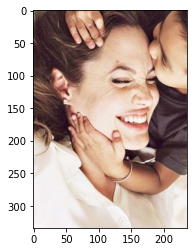

One Face was found


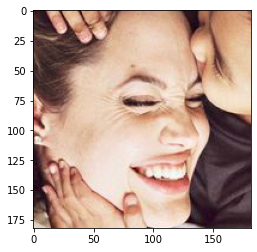

+++++++++++++++++


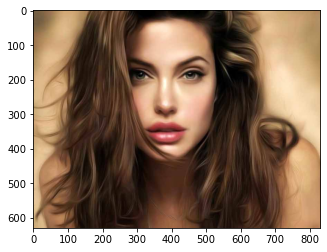

One Face was found


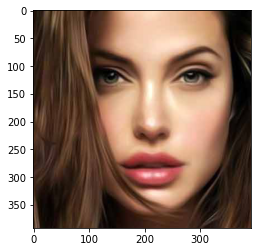

+++++++++++++++++


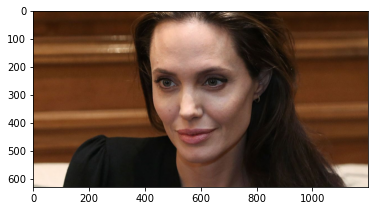

One Face was found


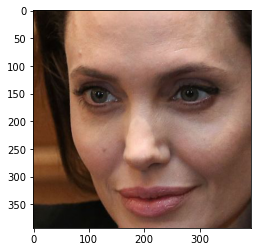

+++++++++++++++++


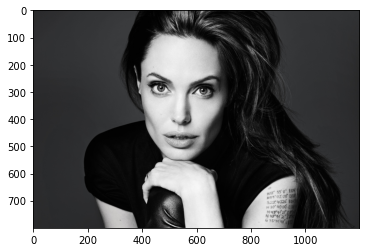

One Face was found


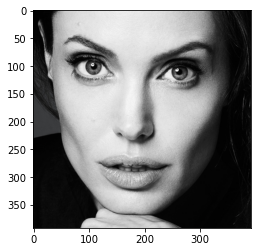

+++++++++++++++++


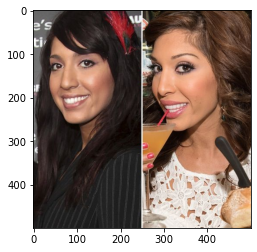

2 Faces were found


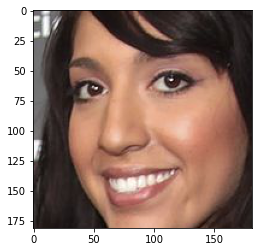

+++++++++++++++++


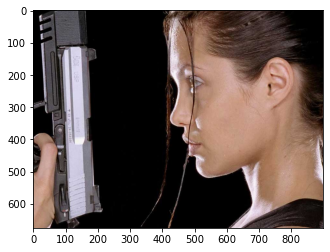

One Face was found


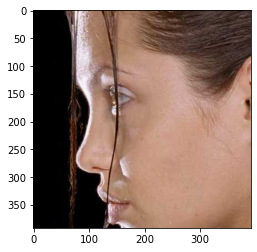

+++++++++++++++++


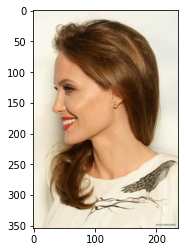

One Face was found


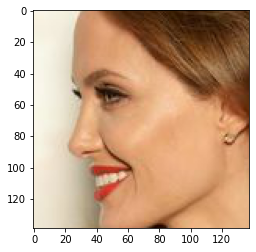

+++++++++++++++++


In [53]:
for im_name in rand_joli_pathes:
    print("=================")
    temp_im = cv2.imread(im_name)
    show_image(im=temp_im)
    face_im = face_detection_cnn(im_name, verbose=True)
    if face_im is not None:
        show_image(im=face_im)
    print("+++++++++++++++++")

#### Apply CNN based on other labels

======== Angelina Jolie =========


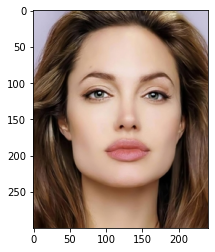

One Face was found


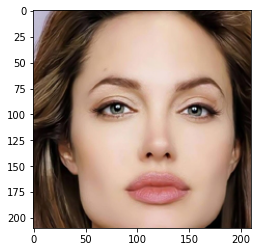

+++++++++++++++++
======== Adam Sandler =========


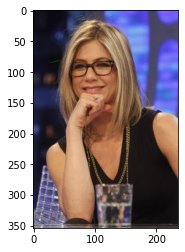

One Face was found


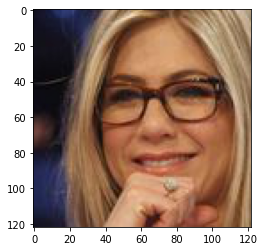

+++++++++++++++++
======== Alan Arkin =========


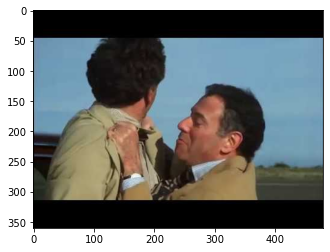

One Face was found


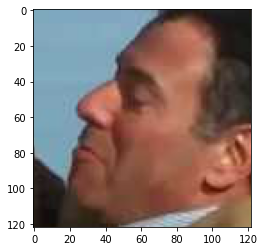

+++++++++++++++++
======== Angela Bassett =========


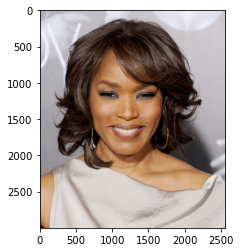

One Face was found


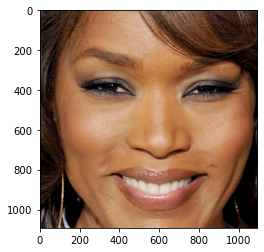

+++++++++++++++++
======== Alex Pettyfer =========


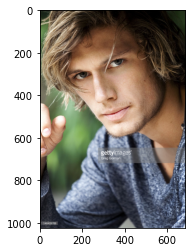

One Face was found


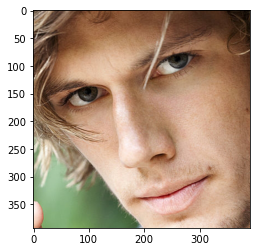

+++++++++++++++++
======== Al Pacino =========


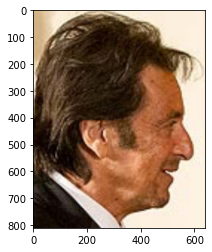

One Face was found


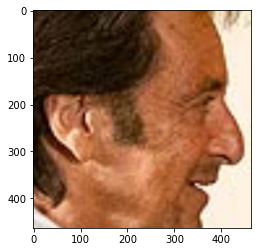

+++++++++++++++++
======== Andy Samberg =========


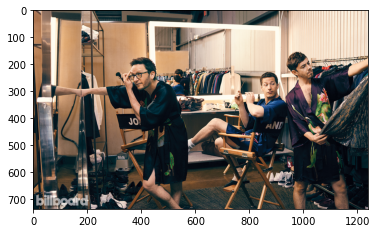

3 Faces were found


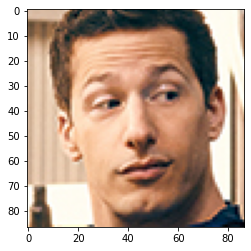

+++++++++++++++++
======== Alan Rickman =========


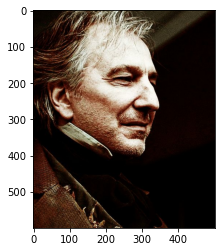

One Face was found


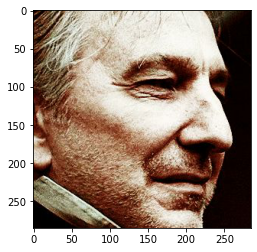

+++++++++++++++++
======== Anna Friel =========


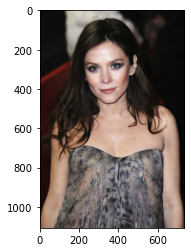

One Face was found


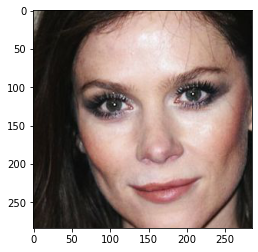

+++++++++++++++++
======== Anna Paquin =========


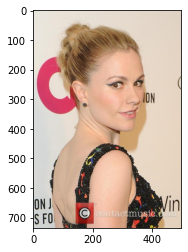

One Face was found


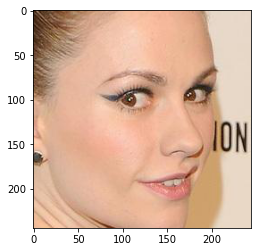

+++++++++++++++++
======== Andrew Luck =========


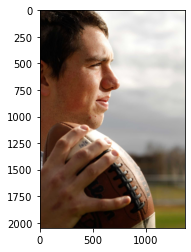

One Face was found


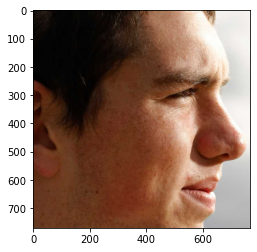

+++++++++++++++++
======== rand_celeb =========


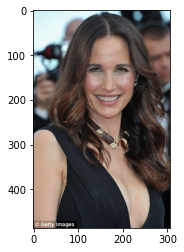

One Face was found


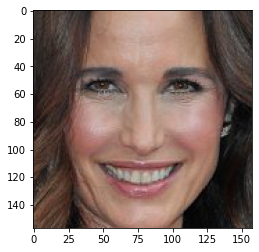

+++++++++++++++++
======== no_face =========


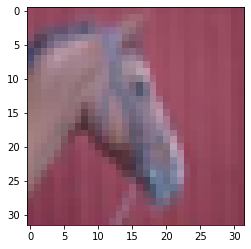

No Face was found
+++++++++++++++++


In [54]:
for l, im_name in other_rand_samples:
    print(f"======== {l} =========")
    temp_im = cv2.imread(im_name)
    show_image(im=temp_im)
    face_im = face_detection_cnn(im_name, verbose=True)
    if face_im is not None:
        show_image(im=face_im)
    print("+++++++++++++++++")

#### Save dataset

In [ ]:
df['cnnalg_pathes'] = df['oroginal_path'].progress_apply(lambda x: preprocess_data(
    filename=x, 
    detection_alg=face_detection_cnn, 
    load_image=False, 
    save_folder=CNN_DATAEST
))

In [70]:
print(" Percantage of no face found (True)")
df.loc[df['label'] != 'no_face', 'cnnalg_pathes'].isna().value_counts(normalize=True)

 Percantage of no face found (True)


False    0.971063
True     0.028937
Name: cnnalg_pathes, dtype: float64

In [84]:
detection_result_df = detection_result_df.append({
    'alg_name': 'cnn',
    'percantage_of_founded_face': (~df.loc[df['label'] != 'no_face', 'cnnalg_pathes'].isna()).sum() / (df['label'] != 'no_face').sum(),
    'time': '65hours 2min 23sec',
    'quality': 'nealy no mistakes'
}, ignore_index=True)

detection_result_df

,alg_name,percantage_of_founded_face,time,quality
0,violla_default,0.793898,11min 41sec,some mistakes
1,violla_mn5_sf3,0.189961,18min 17sec,very bad
2,violla_mn1_sfdef,0.896949,11min 54sec,some mistakes
3,violla_mn5_sf105,0.821949,49min 41sec,some mistakes
4,hog,0.905217,57min 59sec,few mistakes
5,cnn,0.971063,65hours 2min 23sec,nealy no mistakes


### Save DFs

In [85]:
df

,oroginal_path,label,basename,violla_default_pathes,violla_mn5_sf3_pathes,violla_mn1_sfdef_pathes,hog_pathes,cnnalg_pathes,violla_mn5_sf105_pathes
0,/ssd_data/celebrity_data/dir_001/Angelina Joli...,Angelina Jolie,104.jpg,/ssd_data/celebrity_data/violla/default/Angeli...,None,/ssd_data/celebrity_data/violla/mn1_sfdef/Ange...,None,/ssd_data/celebrity_data/cnnalg/Angelina Jolie...,/ssd_data/celebrity_data/violla/mn5_sf105/Ange...
1,/ssd_data/celebrity_data/dir_001/Angelina Joli...,Angelina Jolie,724.jpg,None,None,None,None,/ssd_data/celebrity_data/cnnalg/Angelina Jolie...,None
2,/ssd_data/celebrity_data/dir_001/Angelina Joli...,Angelina Jolie,219.jpg,None,None,None,None,/ssd_data/celebrity_data/cnnalg/Angelina Jolie...,None
3,/ssd_data/celebrity_data/dir_001/Angelina Joli...,Angelina Jolie,541.jpg,/ssd_data/celebrity_data/violla/default/Angeli...,None,/ssd_data/celebrity_data/violla/mn1_sfdef/Ange...,/ssd_data/celebrity_data/hog/Angelina Jolie/54...,/ssd_data/celebrity_data/cnnalg/Angelina Jolie...,/ssd_data/celebrity_data/violla/mn5_sf105/Ange...
4,/ssd_data/celebrity_data/dir_001/Angelina Joli...,Angelina Jolie,107.jpg,/ssd_data/celebrity_data/violla/default/Angeli...,None,/ssd_data/celebrity_data/violla/mn1_sfdef/Ange...,/ssd_data/celebrity_data/hog/Angelina Jolie/10...,/ssd_data/celebrity_data/cnnalg/Angelina Jolie...,/ssd_data/celebrity_data/violla/mn5_sf105/Ange...
...,...,...,...,...,...,...,...,...,...
12155,/ssd_data/cifar10/train/5672.png,no_face,5672.png,/ssd_data/celebrity_data/violla/default/cifar/...,/ssd_data/celebrity_data/violla/mn5_sf3/cifar/...,/ssd_data/celebrity_data/violla/mn1_sfdef/cifa...,/ssd_data/celebrity_data/hog/cifar/5672.png,/ssd_data/celebrity_data/cnnalg/cifar/5672.png,/ssd_data/celebrity_data/violla/mn5_sf105/cifa...
12156,/ssd_data/cifar10/train/48106.png,no_face,48106.png,/ssd_data/celebrity_data/violla/default/cifar/...,/ssd_data/celebrity_data/violla/mn5_sf3/cifar/...,/ssd_data/celebrity_data/violla/mn1_sfdef/cifa...,/ssd_data/celebrity_data/hog/cifar/48106.png,/ssd_data/celebrity_data/cnnalg/cifar/48106.png,/ssd_data/celebrity_data/violla/mn5_sf105/cifa...
12157,/ssd_data/cifar10/train/40719.png,no_face,40719.png,/ssd_data/celebrity_data/violla/default/cifar/...,/ssd_data/celebrity_data/violla/mn5_sf3/cifar/...,/ssd_data/celebrity_data/violla/mn1_sfdef/cifa...,/ssd_data/celebrity_data/hog/cifar/40719.png,/ssd_data/celebrity_data/cnnalg/cifar/40719.png,/ssd_data/celebrity_data/violla/mn5_sf105/cifa...
12158,/ssd_data/cifar10/train/32756.png,no_face,32756.png,/ssd_data/celebrity_data/violla/default/cifar/...,/ssd_data/celebrity_data/violla/mn5_sf3/cifar/...,/ssd_data/celebrity_data/violla/mn1_sfdef/cifa...,/ssd_data/celebrity_data/hog/cifar/32756.png,/ssd_data/celebrity_data/cnnalg/cifar/32756.png,/ssd_data/celebrity_data/violla/mn5_sf105/cifa...


In [86]:
df.to_csv('data/processed_df.csv', index=False)

In [87]:
detection_result_df

,alg_name,percantage_of_founded_face,time,quality
0,violla_default,0.793898,11min 41sec,some mistakes
1,violla_mn5_sf3,0.189961,18min 17sec,very bad
2,violla_mn1_sfdef,0.896949,11min 54sec,some mistakes
3,violla_mn5_sf105,0.821949,49min 41sec,some mistakes
4,hog,0.905217,57min 59sec,few mistakes
5,cnn,0.971063,65hours 2min 23sec,nealy no mistakes


In [88]:
detection_result_df.to_csv('data/detction_result_df.csv', index=False)